<details>
  <summary><strong>MIT License (click to expand)</strong></summary>

  <pre>
MIT License
Copyright (c) 2023-2026 AI Course Notebook Contributors
Repository: https://github.com/arch-inform-kaken-group/ai-course-notebooks

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.
  </pre>
</details>


# Dog and Cat Classification with Neural Networks

The goal of this hands-on session is to experience the effect of convolutional layers in image classification. In the first half, we build a neural network model. In the second half, we build a convolutional neural network model.


## Objective: Classify images of dogs and cats

The dataset used in this notebook is a collection of dog and cat images. It is known by names such as "Asirra Dataset," "Cats vs Dogs," and "Cats and Dogs Dataset."

In previous hands-on sessions, we used MNIST, which had already been converted into a format that is easy to analyze in Python. This time, we load ordinary image files (JPEG format) directly.

<br>

Here is some background on this dataset. In "Asirra Dataset," "Asirra" stands for Animal Species Image Recognition for Restricting Access. Asirra was an external anti-spam service (it was fully shut down in October 2014).

<br>

This may be hard to imagine from the phrase "anti-spam service" alone, but you can think of it as a kind of authentication system that distinguishes humans from bots, such as

```
"I am not a robot"
"Select all tiles with bicycles" / "Select all images with crosswalks"
```

<small>Systems like this are called CAPTCHA (Completely Automated Public Turing test to tell Computers and Humans Apart) or HIP (Human Interactive Proof).</small>

<br>

A notable feature of the Asirra dataset is that it was created in partnership with Petfinder.com, the world's largest site for finding homes for homeless pets. The images were manually labeled by people at thousands of animal shelters in the United States and provided to Microsoft Research.

<hr>
Dataset sources:

[Microsoft] https://www.microsoft.com/en-us/download/details.aspx?id=54765 <br>
[Kaggle] https://www.kaggle.com/c/dogs-vs-cats


## Check GPU availability and the TensorFlow version


In [ ]:
!nvidia-smi

Wed May 13 08:46:50 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import tensorflow as tf
import sklearn
import os

print('TensorFlow version:',tf.__version__)
print('scikit-learn version:',sklearn.__version__)

restart_flag = False

if tf.__version__ != '2.20.0':
    !pip install -q --upgrade tensorflow==2.20.0
    print('TensorFlow version:',tf.__version__)
    restart_flag = True

if sklearn.__version__ != '1.6.1':
    !pip install -q --upgrade scikit-learn==1.6.1
    print('scikit-learn version:',sklearn.__version__)
    restart_flag = True

# The code below runs only when the library versions were changed.
if restart_flag :
    print("Because the library versions were changed, the runtime will restart automatically.")
    print("In Colab, a warning may appear in the lower-left corner saying that it crashed for an unknown reason,")
    print("but you can ignore it and continue running the remaining code cells.")
    # We intentionally shut down the runtime in order to restart it.
    get_ipython().kernel.do_shutdown(restart = True)


TensorFlow version: 2.20.0
scikit-learn version: 1.6.1


### Install an external library
We install a Python library that can easily split a folder containing files such as images into training, validation, and test dataset folders.<br>
[PyPI] https://pypi.org/project/split-folders/


In [ ]:
!pip install split-folders # External library for splitting the dataset

### Import libraries


In [ ]:
import os # os: standard library for OS-dependent tasks such as environment variables and folder creation
import datetime # datetime: standard library for handling date and time data
import random # random: standard library for pseudorandom number generation
import numpy as np # numpy: one of the libraries for numerical computation
import pandas as pd # pandas: one of the libraries for tabular data processing
from IPython.display import display # Function that can display some data more neatly than print() in Colab, etc.
import matplotlib.pylab as plt # matplotlib: one of the libraries for plotting graphs
import seaborn as sns # seaborn: one of the libraries for plotting graphs
from sklearn.metrics import classification_report # One of the machine learning libraries (used here only to output Precision, Recall, and F1-score)
# tensorboard: configuration for dashboard output from the deep learning library TensorFlow
%load_ext tensorboard
import tensorflow as tf # TensorFlow: a deep learning library

import shutil # shutil: standard library for file operations
import splitfolders # split-folders: external library for splitting image data into train, validation, and test folders
import glob # glob: standard library for handling paths

from PIL import ImageFile, Image # PIL: external library for image processing (used here to suppress warnings)
ImageFile.LOAD_TRUNCATED_IMAGES = True # Used to suppress warnings

### Fix the random seed of the pseudorandom number generator

* We fix the pseudorandom sequence generated and used in the program below.
* The random seed is the value used to initialize the pseudorandom number generator.
* If it is not specified explicitly, it is initialized by values such as the current time.
* This time, we fix the random seed to improve reproducibility (so that the same pseudorandom sequence is generated no matter who runs the code or when it is run).

<small>In Colab, perfect reproducibility may still be difficult because the assigned CPU/GPU and library versions can differ.</small>


In [ ]:
def set_seed(seed = 123):
    # Fix the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    # Make TensorFlow neural network operations deterministic
    os.environ['TF_DETERMINISTIC_OPS'] = 'true'
    # Make TensorFlow neural network operations deterministic
    os.environ['TF_CUDNN_DETERMINISTIC'] = 'true'
    # Fix the random seed for Python's standard library
    random.seed(seed)
    # Fix the random seed for NumPy
    np.random.seed(seed)
    # Fix the random seed for TensorFlow
    tf.random.set_seed(seed)

set_seed(2025)


## Get the dataset


In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

# Extract the zip file
!unzip -q kagglecatsanddogs_5340.zip

!ls -lh /content/PetImages

--2026-05-13 08:47:11--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.200.181.207, 2600:1413:5000:12ae::317f, 2600:1413:5000:12a1::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.200.181.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   167MB/s    in 5.0s    

2026-05-13 08:47:16 (157 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]

total 584K
drwxr-xr-x 2 root root 292K Feb 10  2017 Cat
drwxr-xr-x 2 root root 292K Feb 10  2017 Dog


## Check the consistency of the image data
In fact, this dataset is somewhat messy. For example:

1. Some images contain animals other than dogs and cats, or even people.
2. The image sizes and aspect ratios are not consistent.
3. **Some images have a file extension that does not match the actual image format.**

In this image dataset, all file extensions are **only** ".jpg" (JPEG), but some files actually contain PNG data, BMP data, or other image formats.

<small>This can happen when someone changes only the filename extension. Even if you change only the extension, the internal data format does not change. Please do not do this.</small>

In the Python program used here, the code will not run correctly if image files have a mismatch between the data format and the file extension. Therefore, we check the consistency in advance and delete such files.


In [ ]:
# Used to check the consistency of the image data
def get_image_format(filepath):
    try:
        with Image.open(filepath) as img:
            fmt = img.format.lower() if img.format else None
            img.verify()
            return fmt
    except Exception:
        return None

valid_exts = {
    ".jpg": "jpeg",
    ".jpeg": "jpeg",
}

# Create a list of image paths and check all images
dirs = ["/content/PetImages/Cat", "/content/PetImages/Dog",]

for dir_name in dirs:
    for filepath in glob.glob(dir_name + "/*.jpg"):
        extension = os.path.splitext(filepath)[1].lower()
        real_format = get_image_format(filepath)
        if extension in valid_exts and real_format != valid_exts[extension]:
            # The extension is .jpg, but the actual file is not in JPEG format
            print(f"Image file path: {filepath}, actual data format: {real_format}")
            # Delete that file
            os.remove(filepath)
print("Done.")

Image file path: /content/PetImages/Cat/11086.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/11864.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/5370.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/2189.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/8415.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/6486.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/8958.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/5077.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/3197.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/140.jpg, actual data format: gif
Image file path: /content/PetImages/Cat/11565.jpg, actual data format: gif
Image file path: /content/PetImages/Cat/445.jpg, actual data format: bmp
Image file path: /content/PetImages/Cat/7647.jpg, actual data format: bmp
Image file path: /content/PetImages/C

/usr/local/lib/python3.12/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Image file path: /content/PetImages/Dog/1866.jpg, actual data format: gif
Image file path: /content/PetImages/Dog/8889.jpg, actual data format: png
Image file path: /content/PetImages/Dog/1356.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/8563.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/11253.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/522.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/10353.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/9967.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/11853.jpg, actual data format: gif
Image file path: /content/PetImages/Dog/1900.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/9026.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/10351.jpg, actual data format: bmp
Image file path: /content/PetImages/Dog/7128.jpg, actual data format: bmp
Image file path: /content/PetImages

In [ ]:
# Number of images after deletion
print('Cat images '+ str( len(glob.glob("/content/PetImages/Cat/*.jpg"))) )
print('Dog images '+ str( len(glob.glob("/content/PetImages/Dog/*.jpg"))) )


Cat images 12405
Dog images 12364


To save time, we use 1,000 images for each class.


In [ ]:
os.makedirs('sample1000/Dog', exist_ok = True)
os.makedirs('sample1000/Cat', exist_ok = True)


for image in random.sample(glob.glob("/content/PetImages/Cat/*.jpg"), k = 1000):
    new_path = 'sample1000/Cat/' + os.path.basename(image)
    shutil.move(image, new_path)

for image in random.sample(glob.glob("/content/PetImages/Dog/*.jpg"), k = 1000):
    new_path = 'sample1000/Dog/' + os.path.basename(image)
    shutil.move(image, new_path)

## Split the image dataset


In [ ]:
splitfolders.ratio('/content/sample1000', output = "dataset", seed = 1337, ratio = (0.6, 0.2, 0.2))

!ls -lh /content/dataset

Copying files: 2000 files [00:00, 7019.44 files/s]


total 12K
drwxr-xr-x 4 root root 4.0K May 13 08:47 test
drwxr-xr-x 4 root root 4.0K May 13 08:47 train
drwxr-xr-x 4 root root 4.0K May 13 08:47 val


In [ ]:
# Number of images in the train dataset
len_train = len(glob.glob("/content/dataset/train/*/*.jpg"))

# Number of images in the validation dataset
len_valid = len(glob.glob("/content/dataset/val/*/*.jpg"))

# Number of images in the test dataset
len_test = len(glob.glob("/content/dataset/test/*/*.jpg"))

print('Number of images in the train dataset: '+ str(len_train))
print('Number of images in the validation dataset: '+ str(len_valid))
print('Number of images in the test dataset: '+ str(len_test))


Number of images in the train dataset: 1200
Number of images in the validation dataset: 400
Number of images in the test dataset: 400


Explanation of train/val/test and the directory structure

```
dataset ------ train ------ Cat----cat image files
          |             |
          |             --- Dog----dog image files
          |
          ---- val ------ Cat----cat image files
          |             |
          |             --- Dog----dog image files
          |
          ---- test ------ Cat----cat image files
                        |
                        --- Dog----dog image files
```


## Generate input data

We load data from the directories that store the image files and prepare it as input for the learning model.
In this notebook, we do not specify class names, so labels are assigned in directory-name order (`['cat', 'dog']`) by the default setting.


In [ ]:
train_dir = './dataset/train/'
validation_dir = './dataset/val/'
test_dir = './dataset/test/'

image_size = (128, 128)  # Height and width of the input data. Image files are automatically resized to this size.
batch_size = 128  # Batch size. The number of input samples loaded at one time.

image_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1/255.0)
# The RGB values of image data range from 0 to 255.
# By rescaling them to the range from 0 to 1, training converges faster.

train_generator = image_data_generator.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size
)
train_dataset = tf.data.Dataset.from_generator(
    lambda:train_generator,
    output_signature=(
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    ),
)

valid_generator = image_data_generator.flow_from_directory(
    validation_dir,
    target_size=image_size,
    batch_size=batch_size
)
valid_dataset = tf.data.Dataset.from_generator(
    lambda:valid_generator,
    output_signature=(
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    )
)


test_generator = image_data_generator.flow_from_directory(
    test_dir,
    target_size = image_size,
    batch_size = batch_size
)
test_dataset = tf.data.Dataset.from_generator(
    lambda:test_generator,
    output_signature=(
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    )
)


Found 1200 images belonging to 2 classes.
Found 400 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


(128, 128, 128, 3)
(128, 2)


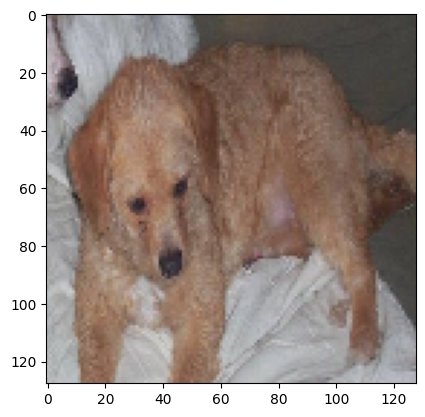

Label: dog
------------------------------------------------------------



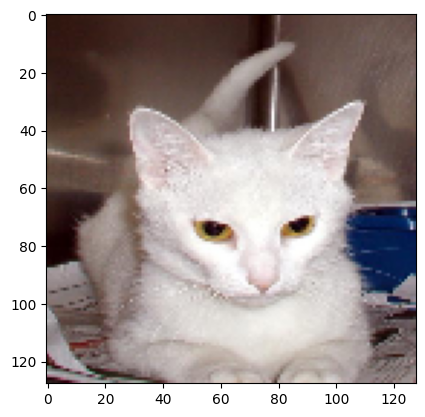

Label: cat
------------------------------------------------------------



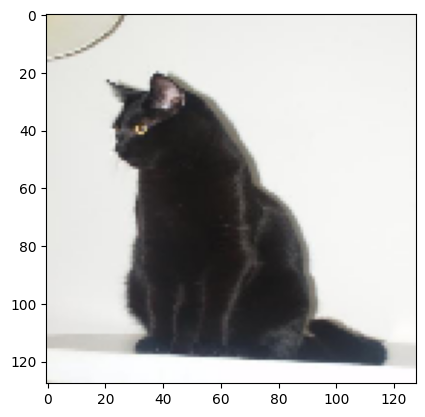

Label: cat
------------------------------------------------------------



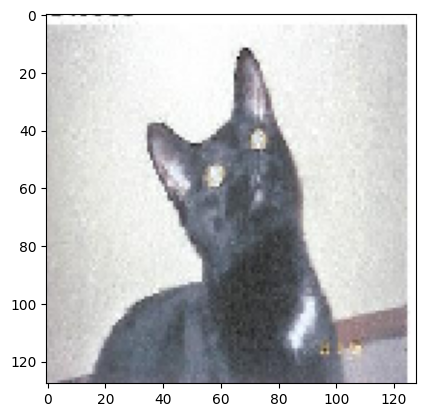

Label: cat
------------------------------------------------------------



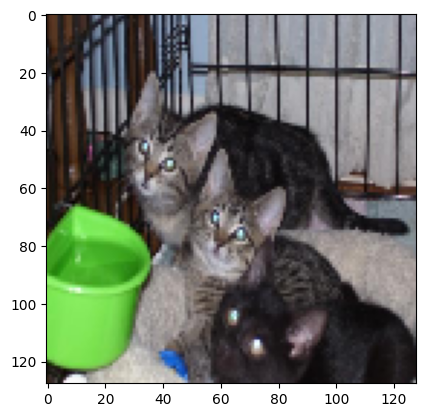

Label: cat
------------------------------------------------------------



In [ ]:
class_names = ['cat', 'dog']

# Get one batch
for images, labels in train_dataset.take(1):

    # This time the batch size is 128,
    # which is too many images to plot.
    print(images.shape)
    print(labels.shape)

    # Plot only the first 5 images.
    for i in range(5):
        plt.imshow(images[i])
        plt.show()
        print('Label:', class_names[np.argmax(labels[i])])
        print(''.join(['-' for _ in range(60)]), end = '\n\n')


## Build a neural network model


In [ ]:
# Input layer: (128 x 128 x 3 channels)
inputs_images = tf.keras.layers.Input( shape = (128, 128, 3), name = 'input' )


# Flatten layer
# (None, 128, 128, 3) -> (None, 49152)
x = tf.keras.layers.Flatten()(inputs_images)

# Dense (fully connected) layers
# (None, 49152) -> (None, 512)
x = tf.keras.layers.Dense(units = 512, kernel_initializer='he_normal', activation = 'relu', name = 'fc_1')(x)
# (None, 512) -> (None, 256)
x = tf.keras.layers.Dense(units = 256, kernel_initializer='he_normal', activation = 'relu', name = 'fc_2')(x)
# (None, 256) -> (None, 128)
x = tf.keras.layers.Dense(units = 128, kernel_initializer='he_normal', activation = 'relu', name = 'fc_3')(x)
# (None, 128) -> (None, 2)
outputs = tf.keras.layers.Dense(units = 2, kernel_initializer='he_normal', activation = 'softmax')(x)

# Define the model
model = tf.keras.Model(inputs = inputs_images, outputs = outputs, name = 'cats_vs_dogs_model')


# Compile the model (set the optimization algorithm, loss function, evaluation metrics, etc.)
# We will learn about the loss function in Section 2.6.
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1.0e-3), # optimization algorithm
              loss = 'categorical_crossentropy', # loss function
              metrics = ['accuracy'] # metric for monitoring (does not affect the training itself)
              )


# Output the model structure as text
model.summary()


Model: "cats_vs_dogs_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 49152)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_1 (Dense)                    │ (None, 512)            │    25,166,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_2 (Dense)                    │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_3 (Dense)                    │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,330,818 (96.63 MB)

 Trainable params: 25,330,818 (96.63 MB)

 Non-trainable params: 0 (0.00 B)

## Train the model


In [ ]:
# Prepare to create a log file during training
callbacks = []
callbacks.append(tf.keras.callbacks.CSVLogger('training_log.csv'))

# Prepare to create TensorBoard logs
os.makedirs('/contents/logs/fit/', exist_ok = True) # Create the folder
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir, histogram_freq = 1)

callbacks.append(tensorboard_callback)

# Train the model (about 3 minutes on GPU)
history = model.fit(train_dataset.shuffle(buffer_size=10),
                    batch_size = batch_size,
                    steps_per_epoch = len_train // batch_size,
                    epochs = 20,
                    verbose = 1,
                    validation_data = valid_dataset,
                    validation_steps = len_valid // batch_size,
                    callbacks = callbacks
                    )


Epoch 1/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.4991 - loss: 24.9074 - val_accuracy: 0.5052 - val_loss: 23.6565
Epoch 2/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.4832 - loss: 15.6411 - val_accuracy: 0.5147 - val_loss: 2.6225
Epoch 3/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5205 - loss: 3.4253 - val_accuracy: 0.5110 - val_loss: 4.3738
Epoch 4/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 982ms/step - accuracy: 0.5205 - loss: 3.5441 - val_accuracy: 0.4963 - val_loss: 3.6099
Epoch 5/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 921ms/step - accuracy: 0.4869 - loss: 3.1236 - val_accuracy: 0.5078 - val_loss: 3.3603
Epoch 6/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5243 - loss: 2.6850 - val_accuracy: 0.4706 - val_loss: 3.3533
Epoch 7/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5495 - loss: 2.2848 - val_accuracy: 0.5074 - val_loss: 4.1841
Epoch 8/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 892ms/step - accuracy: 0.5202 - loss: 2.9021 - val_accuracy: 0.4890 - val_loss: 3.0812
E

## Evaluate the model


### Inference with the trained model


In [ ]:
train_loss, train_acc = model.evaluate(train_dataset, steps = (len_train//batch_size) + 1, verbose = 1)
print("loss (train): {:.4}".format(train_loss))
print("accuracy (train): {:.4}".format(train_acc))

print()

valid_loss, valid_acc = model.evaluate(valid_dataset, steps = (len_valid//batch_size) + 1, verbose = 1)
print("loss (valid): {:.4}".format(valid_loss))
print("accuracy (valid): {:.4}".format(valid_acc))

print()

test_loss, test_acc = model.evaluate(test_dataset, steps = (len_test//batch_size) + 1, verbose = 1)
print("loss (test): {:.4}".format(test_loss))
print("accuracy (test): {:.4}".format(test_acc))

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 337ms/step - accuracy: 0.6700 - loss: 0.5975
loss (train): 0.5975
accuracy (train): 0.67

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 304ms/step - accuracy: 0.5600 - loss: 0.7416
loss (valid): 0.7416
accuracy (valid): 0.56

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - accuracy: 0.5625 - loss: 0.7730
loss (test): 0.773
accuracy (test): 0.5625


### Display the log


In [ ]:
log_df = pd.read_csv('training_log.csv')
display(log_df.head(10))

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.499132,24.907356,0.505208,23.656509
1,1,0.483209,15.641064,0.514706,2.622520
2,2,0.520522,3.425309,0.511029,4.373835
3,3,0.520522,3.544117,0.496324,3.609853
4,4,0.486940,3.123616,0.507812,3.360335
5,5,0.524254,2.684971,0.470588,3.353259
6,6,0.549479,2.284759,0.507353,4.184111
7,7,0.520161,2.902117,0.488971,3.081244
8,8,0.517724,1.788121,0.541667,0.976879
9,9,0.596082,0.864200,0.507353,1.013137


### Changes in the loss function and evaluation metric


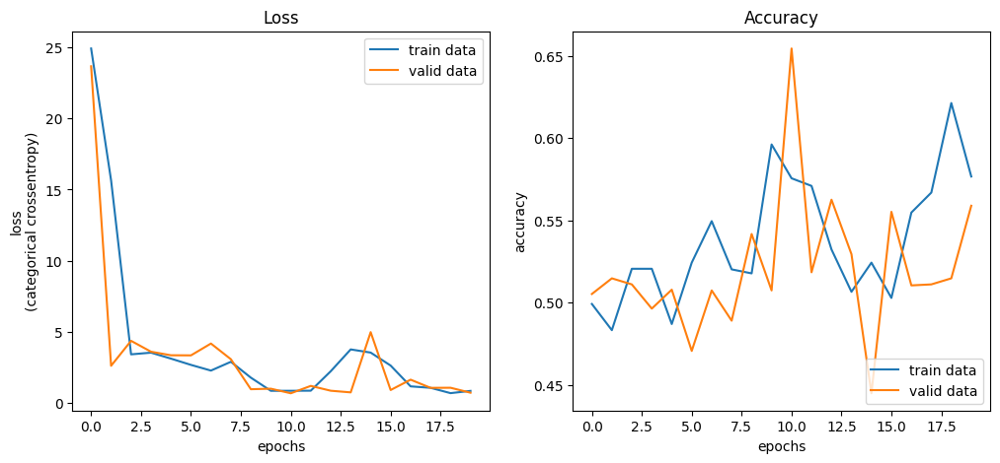

In [ ]:
epochs = log_df["epoch"].values
train_acc = log_df["accuracy"].values
train_loss = log_df["loss"].values
valid_acc = log_df["val_accuracy"].values
valid_loss = log_df["val_loss"].values

fig, axes = plt.subplots(1,2, figsize = (12,5))

axes[0].plot(epochs, train_loss, label = "train data")
axes[0].plot(epochs, valid_loss, label = "valid data")
axes[0].set_xlabel("epochs")
axes[0].set_ylabel("loss\n(categorical crossentropy)")
axes[0].legend(loc="upper right")
axes[0].set_title("Loss")

axes[1].plot(epochs, train_acc, label = "train data")
axes[1].plot(epochs, valid_acc, label = "valid data")
axes[1].set_xlabel("epochs")
axes[1].set_ylabel("accuracy")
axes[1].legend(loc = "lower right")
axes[1].set_title("Accuracy")

plt.show()

The `train` loss and accuracy seem to improve little by little as training continues.

Looking at the `validation` loss and accuracy, the loss appears to converge, but the accuracy changes a lot. This suggests that the model has not learned very well.


Let us check the results using a confusion matrix. A confusion matrix is a table like the one below.

|↓ Ground truth / Output →| 0: Cat | 1: Dog |
|:---|:---|:---|
|0: Cat|Predicted cat correctly|Predicted dog even though it is a cat|
|1: Dog|Predicted cat even though it is a dog|Predicted dog correctly|

In this table, the correct predictions are the diagonal entries: "Predicted cat correctly" and "Predicted dog correctly."


### Draw the confusion matrix


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


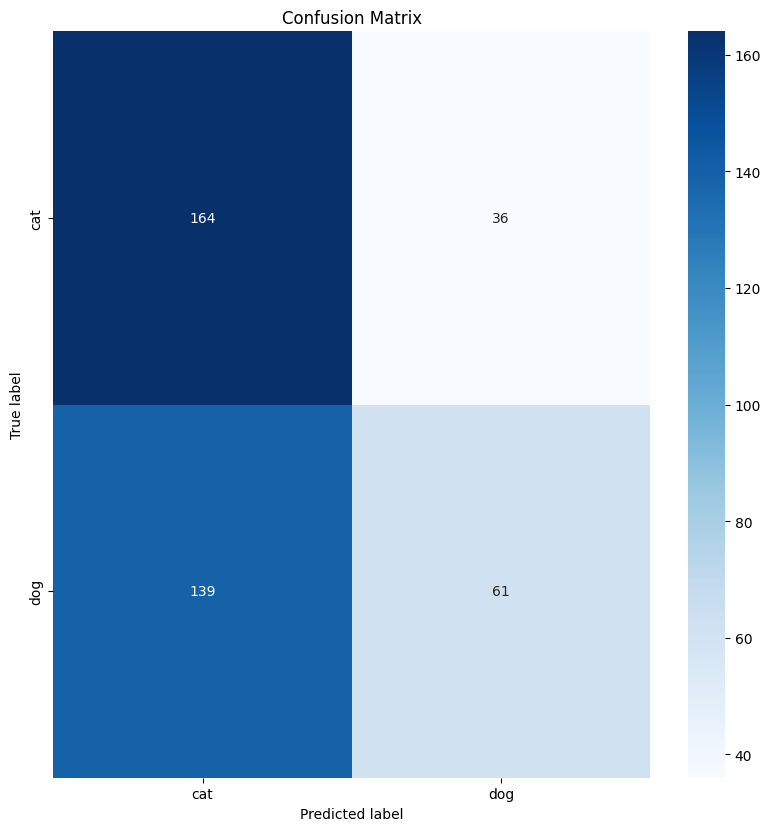

In [ ]:
class_names = ['cat', 'dog']

con_matrix = np.zeros((2,2))

for x, y in test_dataset.take( (len_test//batch_size) + 1 ):
    y_pred = np.argmax(model.predict(x), axis = -1)
    y_true = np.argmax(y, axis=1)
    con_matrix += tf.math.confusion_matrix(labels = y_true, predictions = y_pred).numpy()

con_mat_df = pd.DataFrame(con_matrix,
                     index = class_names,
                     columns = class_names
                     )

figure = plt.figure(figsize=(8, 8))
sns.heatmap(con_mat_df, annot = True, cmap = plt.cm.Blues, fmt = 'g')
plt.tight_layout()
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

(128, 128, 128, 3)
(128, 2)


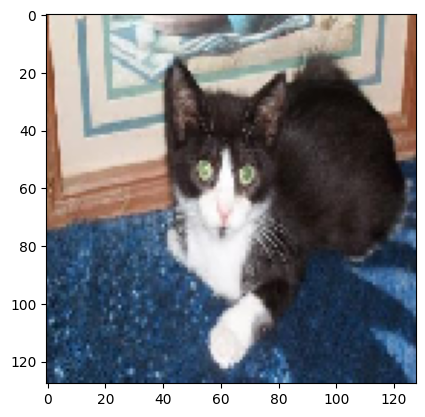

Prediction: cat
Ground truth: cat
------------------------------------------------------------



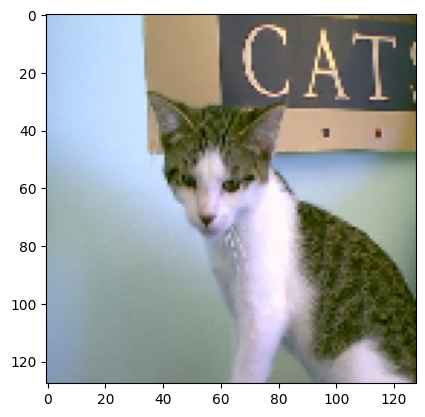

Prediction: cat
Ground truth: cat
------------------------------------------------------------



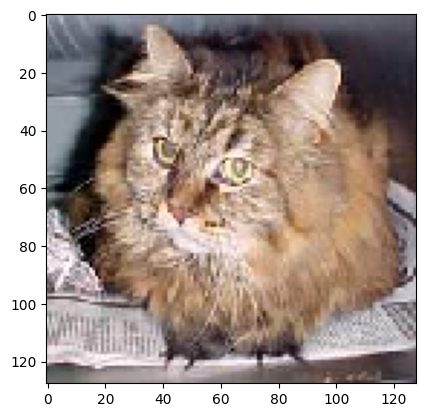

Prediction: cat
Ground truth: cat
------------------------------------------------------------



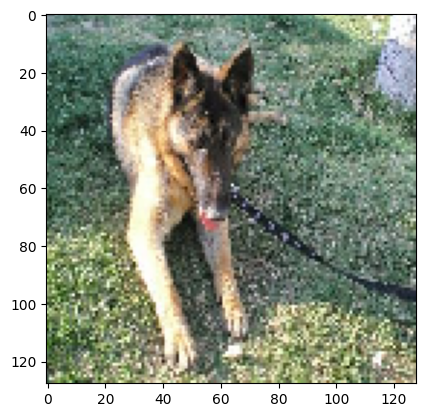

Prediction: dog
Ground truth: dog
------------------------------------------------------------



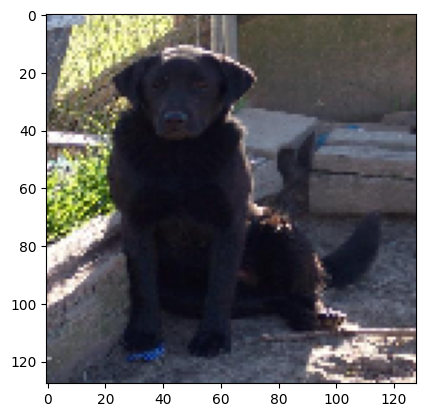

Prediction: cat
Ground truth: dog
------------------------------------------------------------



In [ ]:
code_to_class = {0: 'cat', 1: 'dog'}

# Get one batch
for images, labels in train_dataset.take(1):

    y_true = np.argmax( labels, axis = 1 )
    y_prob = model.predict_on_batch( images )
    y_pred = np.argmax( y_prob, axis = 1 )

    # This time the batch size is 128,
    # which is too many images to plot.
    print(images.shape)
    print(labels.shape)

    # Plot only the first 5 images.
    for i in range(5):
        plt.imshow(images[i])
        plt.show()
        print('Prediction:', code_to_class[y_pred[i]])
        print('Ground truth:', code_to_class[y_true[i]])
        print(''.join(['-' for _ in range(60)]), end = '\n\n')


# Dog and Cat Classification with a Convolutional Neural Network

A network with only fully connected layers does not give very good accuracy. So, we improve the previous model and build a convolutional neural network this time.


### Generate input data

This is the same as before.


In [ ]:
train_dir = './dataset/train/'
validation_dir = './dataset/val/'
test_dir = './dataset/test/'

image_size = (128, 128)  # Height and width of the input data. Image files are automatically resized to this size.
batch_size = 128  # Batch size. The number of input samples loaded at one time.

image_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1/255.0)
# The RGB values of image data range from 0 to 255.
# By rescaling them to the range from 0 to 1, training converges faster.


train_generator = image_data_generator.flow_from_directory(
    train_dir,
    target_size = image_size,
    batch_size = batch_size
)
train_dataset = tf.data.Dataset.from_generator(
    lambda:train_generator,
    output_signature=(
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    ),
)

valid_generator = image_data_generator.flow_from_directory(
    validation_dir,
    target_size = image_size,
    batch_size = batch_size
)
valid_dataset = tf.data.Dataset.from_generator(
    lambda:valid_generator,
    output_signature = (
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    )
)


test_generator = image_data_generator.flow_from_directory(
    test_dir,
    target_size = image_size,
    batch_size = batch_size
)
test_dataset = tf.data.Dataset.from_generator(
    lambda:test_generator,
    output_signature = (
        tf.TensorSpec(shape = (None, 128, 128, 3), dtype = tf.float32),
        tf.TensorSpec(shape = (None, 2), dtype = tf.float32),
    )
)


Found 1200 images belonging to 2 classes.
Found 400 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


### Build a convolutional neural network model

We build it as follows.


In [ ]:
# Input layer: (128 x 128 x 3 channels)
inputs_images = tf.keras.layers.Input(shape = (128, 128, 3), name = 'input')

# 32 convolution kernels (filters) of size 3x3
x = tf.keras.layers.Conv2D(filters = 32, strides = (1, 1), kernel_size = (3, 3),\
                           kernel_initializer='he_normal', activation = 'relu', name = 'conv_1')(inputs_images)
# 2x2 Max Pooling
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), name = 'pool_1')(x)
# 64 convolution kernels (filters) of size 3x3
x = tf.keras.layers.Conv2D(filters = 64, strides = (1, 1), kernel_size = (3, 3),\
                           kernel_initializer='he_normal', activation = 'relu', name = 'conv_2')(x)
# 2x2 Max Pooling
x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), name = 'pool_2')(x)


# Flatten layer
# (None, 30, 30, 64) -> (None,  57600)
x = tf.keras.layers.Flatten()(x)

# Dense (fully connected) layers
# (None, 57600) -> (None, 512)
x = tf.keras.layers.Dense(units = 512, kernel_initializer='he_normal', activation = 'relu', name = 'fc_1')(x)
# (None, 512) -> (None, 256)
x = tf.keras.layers.Dense(units = 256, kernel_initializer='he_normal', activation = 'relu', name = 'fc_2')(x)
# (None, 256) -> (None, 128)
x = tf.keras.layers.Dense(units = 128, kernel_initializer='he_normal', activation = 'relu', name = 'fc_3')(x)
# (None, 128) -> (None, 2)
outputs = tf.keras.layers.Dense(units = 2, kernel_initializer='he_normal', activation = 'softmax')(x)

# Define the model
model = tf.keras.Model(inputs = inputs_images, outputs = outputs, name = 'cats_vs_dogs_cnn_model')


# Compile the model (set the optimization algorithm, loss function, evaluation metrics, etc.)
# We will learn about the loss function in Section 2.6.
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1.0e-3), # optimization algorithm
              loss = 'categorical_crossentropy', # loss function
              metrics = ['accuracy'] # metric for monitoring (does not affect the training itself)
              )


# Output the model structure as text
model.summary()


Model: "cats_vs_dogs_cnn_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_1 (Dense)                    │ (None, 512)            │    29,491,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_2 (Dense)                    │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_3 (Dense)                    │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,675,586 (113.20 MB)

 Trainable params: 29,675,586 (113.20 MB)

 Non-trainable params: 0 (0.00 B)

## Train the model


In [ ]:
# Prepare to create a log file during training
callbacks = []
callbacks.append(tf.keras.callbacks.CSVLogger('training_log_cnn.csv'))

# Prepare to create TensorBoard logs
os.makedirs('/contents/logs_cnn/fit/', exist_ok=True) # Create the folder
log_dir = "logs_cnn/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir, histogram_freq = 1)

callbacks.append(tensorboard_callback)

# Train the model (about 5 minutes on GPU)
history = model.fit(train_dataset.shuffle(buffer_size=10),
                    batch_size = batch_size,
                    steps_per_epoch = len_train // batch_size,
                    epochs = 20,
                    verbose = 1,
                    validation_data = valid_dataset,
                    validation_steps = len_valid // batch_size,
                    callbacks = callbacks
                    )


Epoch 1/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.4683 - loss: 24.9388 - val_accuracy: 0.4948 - val_loss: 6.5266
Epoch 2/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.4974 - loss: 2.2826 - val_accuracy: 0.5551 - val_loss: 0.7155
Epoch 3/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5292 - loss: 0.8464 - val_accuracy: 0.4890 - val_loss: 0.8027
Epoch 4/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5582 - loss: 0.7321 - val_accuracy: 0.5037 - val_loss: 0.7487
Epoch 5/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5728 - loss: 0.6624 - val_accuracy: 0.5677 - val_loss: 0.6832
Epoch 6/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.7319 - loss: 0.5523 - val_accuracy: 0.6360 - val_loss: 0.6632
Epoch 7/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.7966 - loss: 0.4684 - val_accuracy: 0.6324 - val_loss: 0.6861
Epoch 8/20
9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.8429 - loss: 0.3842 - val_accuracy: 0.5956 - val_loss: 0.6990
Epoch 9/

## Evaluate the model


### Inference with the trained model


In [ ]:
train_loss, train_acc = model.evaluate(train_dataset, steps = (len_train // batch_size) + 1, verbose = 1)
print("loss (train): {:.4}".format(train_loss))
print("accuracy (train): {:.4}".format(train_acc))

print()

valid_loss, valid_acc = model.evaluate(valid_dataset, steps = (len_valid // batch_size) + 1, verbose = 1)
print("loss (valid): {:.4}".format(valid_loss))
print("accuracy (valid): {:.4}".format(valid_acc))

print()

test_loss, test_acc = model.evaluate(test_dataset, steps = (len_test // batch_size) + 1, verbose = 1)
print("loss (test): {:.4}".format(test_loss))
print("accuracy (test): {:.4}".format(test_acc))

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - accuracy: 0.9992 - loss: 0.0070
loss (train): 0.006972
accuracy (train): 0.9992

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - accuracy: 0.6625 - loss: 1.4708
loss (valid): 1.471
accuracy (valid): 0.6625

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.6325 - loss: 1.4270
loss (test): 1.427
accuracy (test): 0.6325


### Display the log


In [ ]:
log_df = pd.read_csv('training_log_cnn.csv')
display(log_df.head(10))

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.468284,24.938801,0.494792,6.526634
1,1,0.497396,2.282575,0.555147,0.715484
2,2,0.529234,0.846444,0.488971,0.802735
3,3,0.558160,0.732079,0.503676,0.748672
4,4,0.572761,0.662430,0.567708,0.683163
5,5,0.731855,0.552264,0.636029,0.663186
6,6,0.796642,0.468397,0.632353,0.686120
7,7,0.842882,0.384211,0.595588,0.699000
8,8,0.870660,0.314837,0.625000,0.737184
9,9,0.911381,0.244167,0.595588,0.751156


### Changes in the loss function and evaluation metric


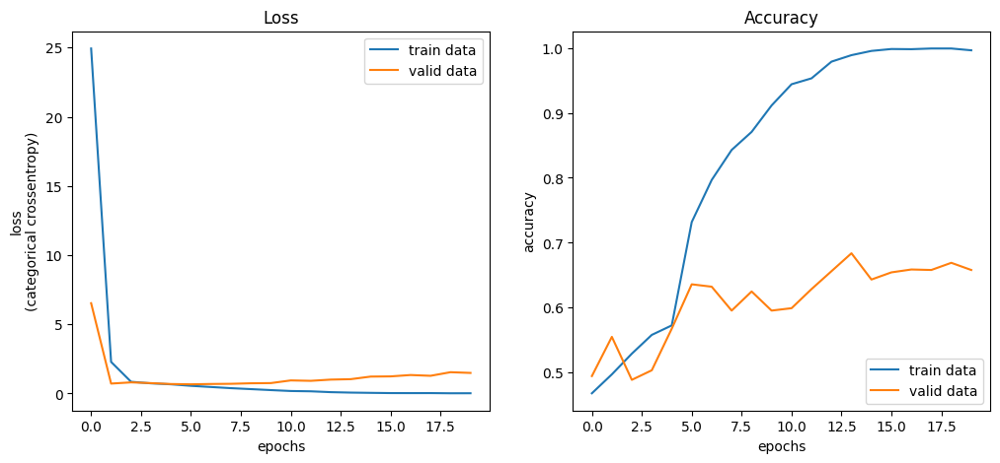

In [ ]:
epochs = log_df["epoch"].values
train_acc = log_df["accuracy"].values
train_loss = log_df["loss"].values
valid_acc = log_df["val_accuracy"].values
valid_loss = log_df["val_loss"].values

fig, axes = plt.subplots(1,2, figsize=(12,5))

axes[0].plot(epochs, train_loss, label="train data")
axes[0].plot(epochs, valid_loss, label="valid data")
axes[0].set_xlabel("epochs")
axes[0].set_ylabel("loss\n(categorical crossentropy)")
axes[0].legend(loc="upper right")
axes[0].set_title("Loss")

axes[1].plot(epochs, train_acc, label="train data")
axes[1].plot(epochs, valid_acc, label="valid data")
axes[1].set_xlabel("epochs")
axes[1].set_ylabel("accuracy")
axes[1].legend(loc="lower right")
axes[1].set_title("Accuracy")

plt.show()

We can see that the accuracy, which changed a lot before, has improved. At the same time, we can also see that overfitting has clearly started.


### Draw the confusion matrix


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


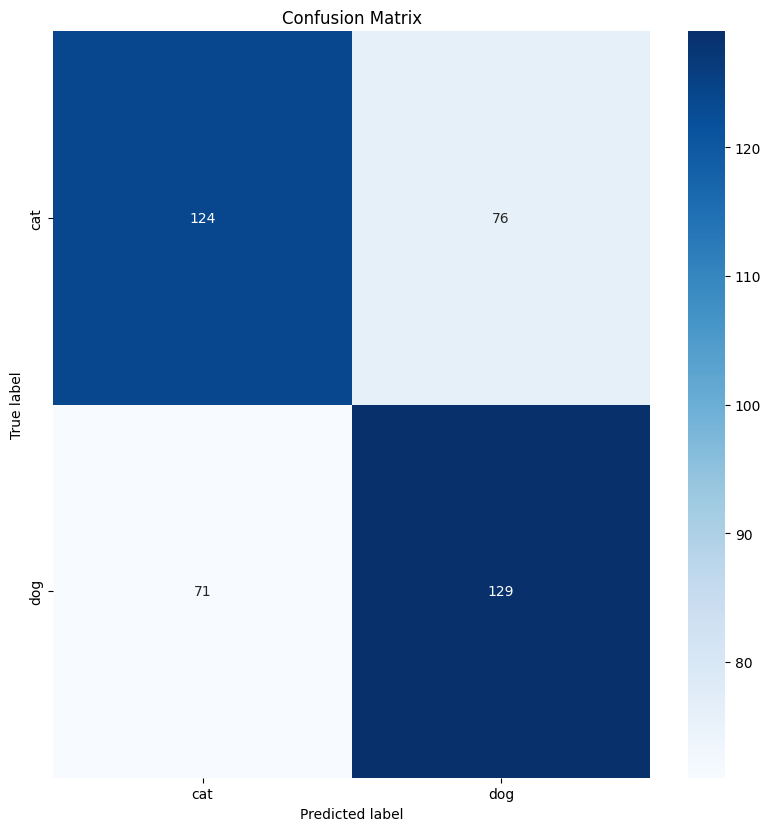

In [ ]:
class_names = ['cat', 'dog']

con_matrix = np.zeros((2,2))

for x, y in test_dataset.take( (len_test//batch_size) + 1 ):
    y_pred = np.argmax(model.predict(x), axis = -1)
    y_true = np.argmax(y, axis = 1)
    con_matrix += tf.math.confusion_matrix(labels = y_true, predictions = y_pred).numpy()

con_mat_df = pd.DataFrame(con_matrix,
                     index = class_names,
                     columns = class_names
                     )

figure = plt.figure(figsize = (8, 8))
sns.heatmap(con_mat_df, annot = True, cmap = plt.cm.Blues, fmt = 'g')
plt.tight_layout()
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

This time, the convolutional neural network seems to classify the images better.


(48, 128, 128, 3)
(48, 2)


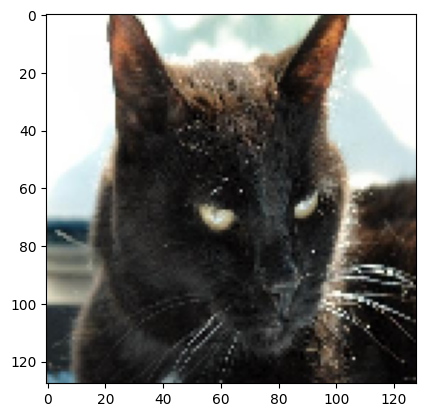

Prediction: cat
Ground truth: cat
------------------------------------------------------------



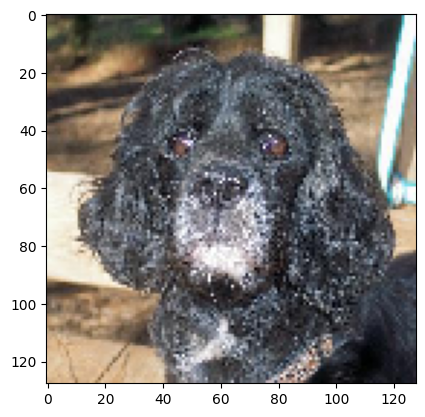

Prediction: dog
Ground truth: dog
------------------------------------------------------------



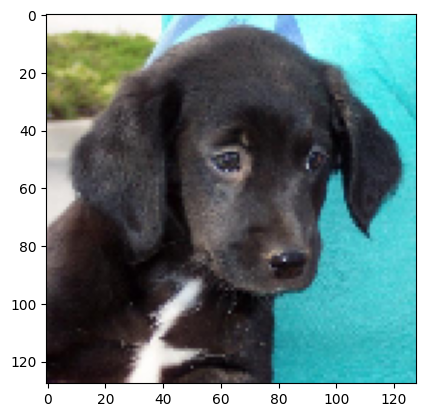

Prediction: dog
Ground truth: dog
------------------------------------------------------------



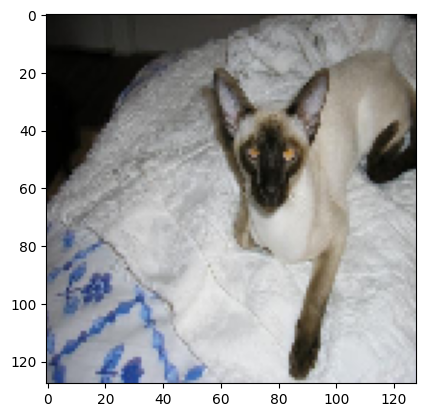

Prediction: cat
Ground truth: cat
------------------------------------------------------------



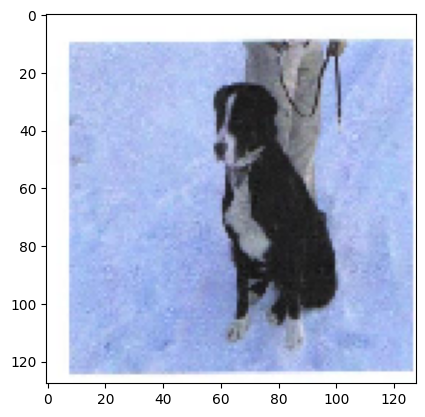

Prediction: dog
Ground truth: dog
------------------------------------------------------------



In [ ]:
code_to_class = {0: 'cat', 1: 'dog'}

# Get one batch
for images, labels in train_dataset.take(1):

    y_true = np.argmax( labels, axis = 1 )
    y_prob = model.predict_on_batch( images )
    y_pred = np.argmax( y_prob, axis = 1 )

    # This time the batch size is 128,
    # which is too many images to plot.
    print(images.shape)
    print(labels.shape)

    # Plot only the first 5 images.
    for i in range(5):
        plt.imshow(images[i])
        plt.show()
        print('Prediction:', code_to_class[y_pred[i]])
        print('Ground truth:', code_to_class[y_true[i]])
        print(''.join(['-' for _ in range(60)]), end = '\n\n')


### Visualization with TensorBoard

When you run this code, allow third-party cookies in the browser where Colab is open. (If they are blocked, a 403 error will be shown.)


In [ ]:
%tensorboard --logdir logs_cnn/fit

<IPython.core.display.Javascript object>